In [2]:
#00 zaczytanie bibliotek

from mesa import Agent, Model
from mesa.space import MultiGrid, SingleGrid
from mesa.datacollection import DataCollector
from mesa.time import RandomActivation,SimultaneousActivation

import imageio
import random
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import gridspec
import os 

In [3]:
### 01 model ###
class Juntion_model(Model):
    
    def __init__(self, amount_of_types, N=100, length=5, visualization=True):
        
        self.num_agents = N
        self.visualization = visualization
        self.number_of_crashes = 0
        
        self.grid_length = 2 * length + 2
        self.grid = MultiGrid(self.grid_length, self.grid_length, True)
        self.create_grid_matrix(length)
        
        self.juction = [(length, length), (length+1, length+1), (length+1, length), (length, length+1)]
        
        
        # liczby odpowiednich typów 
        self.profile_types = (amount_of_types['Righteous'] * ['Righteous'] 
                             + amount_of_types['Hoarder'] * ['Hoarder'] 
                             + amount_of_types['Nervous'] * ['Nervous'] 
                             + amount_of_types['Frustrated'] * ['Frustrated']
                             + amount_of_types['Altruistic'] * ['Altruistic'])
        
        
        self.start = {'N':(0, length)
        ,'S':(2 * length + 1, length +1)
        ,'E':(length, 2 * length + 1)
        ,'W':(length + 1, 0)}

        self.end = {'N':(0, length + 1)
        ,'S':(2 * length + 1, length)
        ,'E':(length + 1, 2 * length + 1)
        ,'W':(length, 0)}
        
        
                
        self.all_next_pos = {}
        
        self.epoch = 0
        self.current_time = 0
        self.time_steps = 5
        
        
        self.schedule = SimultaneousActivation(self)
        
        self.datacollector = DataCollector(
                  agent_reporters={"points": lambda a: a.points,
                                   "profile": lambda a: a.profile,
                                   "haste": lambda a: a.haste,
                                   "type_of_cross": lambda a: a.type_of_cross,
                                   "time_at_junction_all": lambda a: a.time_at_junction_all}
            )

        
        # Create agents
        for i in range(self.num_agents):

            # Add the agent to a random grid cell
            while True:
                x = self.random.randrange(0, self.grid.width)
                y = self.random.randrange(0, self.grid.height)
                if self.grid_matrix[x,y] !=  0:
                    break
             
            
            
            starting_point, ending_point, after_crosing_point = self.find_starting_ending_points(x,y)
            crossing_point = self.find_crossing_point(starting_point, ending_point)
            self.grid_matrix[x,y] = 0
            
            profile = self.create_profile()
            
            a = DriverAgent(i, starting_point, ending_point, crossing_point, after_crosing_point, profile, self)
            self.schedule.add(a)
            self.grid.place_agent(a, (x, y))
     
    
    # after all, create again
#     self.create_grid_matrix(length)
    
    
    # functions
    
    def create_grid_matrix(self, length):
        self.grid_matrix = np.zeros([length * 2 + 2, length * 2 + 2])


        #start
        self.grid_matrix[:length, length]     = 1 # N --> 1
        self.grid_matrix[length+2:, length+1] = 2 # S --> 2
        self.grid_matrix[length, length+2:]   = 3 # E --> 3
        self.grid_matrix[length+1, :length]   = 4 # W --> 4
        
        #meta
        self.grid_matrix[:length, length+1]   = -1 # N --> -1
        self.grid_matrix[length+2:, length]   = -2 # S --> -2
        self.grid_matrix[length+1, length+2:] = -3 # E --> -3
        self.grid_matrix[length, :length]     = -4 # W --> -4
        
        
        

    
    
    def find_starting_ending_points(self, x, y):
        
        directions = ['N', 'S', 'E', 'W']
        
        # starting point
        if self.grid_matrix[x,y] == 1:
            
            starting_point = 'N'
            directions.remove('N')
            ending_point = random.choice(directions)
            after_crosing_point = False
        
        elif self.grid_matrix[x,y] == 2:
            starting_point = 'S'
            directions.remove('S')
            ending_point = random.choice(directions)
            after_crosing_point = False
            
        elif self.grid_matrix[x,y] == 3:
            starting_point = 'E'
            directions.remove('E')
            ending_point = random.choice(directions)
            after_crosing_point = False
            
        elif self.grid_matrix[x,y] == 4:
            starting_point = 'W'
            directions.remove('W')
            ending_point = random.choice(directions)
            after_crosing_point = False
        
        
        # ending point
        elif self.grid_matrix[x,y] == -1:
            
            ending_point = 'N'
            directions.remove('N')
            starting_point = random.choice(directions)
            after_crosing_point = True
        
        elif self.grid_matrix[x,y] == -2:
            ending_point = 'S'
            directions.remove('S')
            starting_point = random.choice(directions)
            after_crosing_point = True
            
        elif self.grid_matrix[x,y] == -3:
            ending_point = 'E'
            directions.remove('E')
            starting_point = random.choice(directions)
            after_crosing_point = True
            
        elif self.grid_matrix[x,y] == -4:
            ending_point = 'W'
            directions.remove('W')
            starting_point = random.choice(directions)
            after_crosing_point = True
    
        return starting_point, ending_point, after_crosing_point
    
    
    
    def find_crossing_point(self, starting_point, ending_point):
        
        
        where_to_where = (starting_point, ending_point)
    
        # jeśli prosto to nie zwracam
        if where_to_where == ('N', 'S') or where_to_where == ('S', 'N'):
            crossing_point = None
        elif where_to_where == ('E', 'W') or where_to_where == ('W', 'E'):
            crossing_point = None

        # z północy albo z południa
        elif starting_point in ('N', 'S'):
            crossing_point = (self.end[ending_point][0], self.start[starting_point][1])

        # ze wschodu albo zachodu
        elif starting_point in ('E', 'W'):
            crossing_point = (self.start[starting_point][0], self.end[ending_point][1]) 
        
        
        return crossing_point
    
        
        
    # funckja tworząca profile
    def create_profile(self):
        
        choosen_prof = random.choice(self.profile_types)
        self.profile_types.remove(choosen_prof)
        
        return choosen_prof
    
    # funkcja zwracająca liczbę agentów na skrzyżowaniu
    def find_number_on_junction(self):
        number = 0
        
        for x_y in model.juction:
            cellmates = self.grid.get_cell_list_contents([x_y])
            number += len(cellmates)
        return number
        
     
    def step(self):
        for time in range(self.time_steps):
    
            
            self.schedule.step()

            # collect data
            self.datacollector.collect(self)
            
            visualise_all_agent_position(self, self.epoch, self.current_time + 1, self.visualization)
            visualise_crashes(self)
            
        
            self.current_time += 1
            
            # clear next_pos
            self.all_next_pos = {}
            
        self.epoch += 1
        
        #back to zero
        self.current_time = 0
        
    
    
        
        
### 02 agent ###      
class DriverAgent(Agent):
    
    def __init__(self, unique_id, starting_point, ending_point, crossing_point, after_crosing_point, profile, model):
        super().__init__(unique_id, model)  
        
        # pozycje agenta
        self.prev_pos = None
        self.next_pos = None
        
        # kierunki w którym agent chce jechać 
        self.starting_point = starting_point
        self.ending_point = ending_point
        
        # punkt w którym agent musi zacząć skręcać 
        self.crossing_point = crossing_point 
        # informacja czy agent miną już ten punkt 
        self.after_crosing_point = after_crosing_point 
        
        # typ zakrętu jaki wykonuje agent: prawoskrętny/lewoskrętny/prosto
        self.type_of_cross = None
        self.find_type_of_cross()
        
        
        # wybór profilu
        self.profile = profile 
        
        # czas w którym agent wjechał na skrzyżowanie
        self.entry_junction = 0
        
        # ile czasu trawał pobyt na skrzyżowaniu
        self.time_at_junction_all = 0

        
        # losowy pośpiech (od 1 do 5)
        self.haste = self.random.randrange(1, 6)
        
        # losowa prędkość (od 1 do 5)
        self.speed = self.random.randrange(1, 6)
        
        # liczba punktów (startowo 10)
        self.points = 10
        
        # wskaźnik potrzebny dla typu Frustrated
        self.angry = False
        
        # liczik stania w miejscu (potrzebny dla Altruistic i Righteous żeby nie blokować skrzyżowni)
        self.stay = 0

        
        
        
        #01 Righteous - jeśli hastle wiekszy to puszcza 
        #02 Hoarder - chce punkty, chyba że bardzo się spieszy
        #03 Nervous - chce być pierwszy 
        #04 Frustrated - jeśli kilku przed nim przejechało, on też chce
        #05 Altruistic - puszcza wszystkich
        
    # funckja przypisuje typ zakrętu dla agenta  
    def find_type_of_cross(self): #xxx

            where_to_where = (self.starting_point, self.ending_point)
            # right 
            # N -- > W
            # W -- > S
            # S -- > E
            # E -- > N
            if where_to_where in [('N', 'W'), ('W', 'S'), ('S', 'E'), ('E', 'N')]:
                self.type_of_cross = 'right'

            # left  
            # N -- > E
            # W -- > N
            # S -- > W
            # E -- > S
            elif where_to_where in [('N', 'E'), ('W', 'N'), ('S', 'W'), ('E', 'S')]:
                self.type_of_cross = 'left'
            else:
                self.type_of_cross = 'straight'
        
        
        
    def move(self):
        
        x = self.pos[0]
        y = self.pos[1]
        
        self.prev_pos = self.pos
        self.next_pos = (x, y)
        
        
        if (x, y) == self.crossing_point:
            self.after_crosing_point = True
        
        
        # w zależności w którą stronę agent jedzie i czy miną punkt w którym ma zacząć skręcać agent wykonuje odpowiedni ruch
        if not self.after_crosing_point:
            
            if self.starting_point == 'W':
                y += 1

            elif self.starting_point == 'E':
                y -= 1

            elif self.starting_point == 'N':
                x += 1

            elif self.starting_point == 'S':
                x -= 1
            
        else:    
            
            if self.ending_point == 'W':
                y -= 1
 
            elif self.ending_point == 'E':
                y += 1

            elif self.ending_point == 'N':
                x -= 1
    
            elif self.ending_point == 'S':
                x += 1

        # jeśli agent wykracza poza skrzyżowanie to musi zmienić kierunek, jeśli nie, przypisujemy mu next_pos
        if 0 <= x <= model.grid_length - 1 and 0 <= y <= model.grid_length - 1:
            self.next_pos = (x, y)
        else:
            self.change_directions(x,y)
    
    
    # funkcja agreguje wszystkie pozycje agentów w słowniku
    # klucz: pozycja, value: lista zawieająca id agenta
    def add_next_pos(self):
        
        if self.next_pos in model.all_next_pos.keys():
            model.all_next_pos[self.next_pos].append(self.unique_id)
        else:
            model.all_next_pos[self.next_pos] = [self.unique_id]
    
    # funkcja licząca czas na skrzyżowaniu
    def check_junction(self):
        
        pos = self.pos
        if pos in model.juction:
                
            self.time_at_junction_all +=1
                
    # funkcja zwraca liczbę agentów na skrzyżowaniu
    def find_number_on_junction(self):
        number = 0
        
        for x_y in model.juction:
            cellmates = self.model.grid.get_cell_list_contents([x_y])
            number += len(cellmates)
        return number  
    
            
    
    # zmiana kierunku jazdy i reset wszystkich parametrów jeśli agent dojedzie do końca
    def change_directions(self, x, y):
        
        
        if self.ending_point == 'N':
            next_pos_buff = (x + 1, y - 1)
            
        elif self.ending_point == 'S':
            next_pos_buff = (x - 1, y + 1)
            
        elif self.ending_point == 'E':
            next_pos_buff = (x - 1 , y - 1)
        
        elif self.ending_point == 'W':
            next_pos_buff = (x + 1 , y + 1)     
            
        cellmates = self.model.grid.get_cell_list_contents([next_pos_buff])
        
        if len(cellmates) == 0:
            self.speed = self.random.randrange(1, 6)
            self.next_pos  = next_pos_buff

            buff = self.ending_point 
            self.ending_point = self.starting_point 
            self.starting_point = buff

            #change crossing point
            self.crossing_point = model.find_crossing_point(self.starting_point, self.ending_point)
            self.after_crosing_point = False
            self.find_type_of_cross
        else:
            self.next_pos = self.pos

        
    # funkcja odpowiedzialna za negocjacje między agentami
    def negotiate(self, cellmates_id):
        
        # lista zawierająca agentów biorących udział w negocjacjach
        agents_to_interaction = []
        
        for a in model.schedule.agents:
            if a.unique_id in cellmates_id:
                agents_to_interaction.append(a)
        
        
        # słownik zawierający informację jaką liczbe punktów przekazał każdy agent 
        list_of_points = {}
        
        # słownik odwrotny do porzedniego
        list_of_agents = {}
        
        # w zależności od rodzaju agenta, agent określa liczbę punktów określającą jak bardzo mu zależy na przejeździe
        for a in agents_to_interaction:
            
            if a.profile == 'Righteous':
                
                for agent in agents_to_interaction:
                    min_haste = 5 
                    if agent.haste <= min_haste and a != agent:
                        min_haste = agent.haste
                        
                if a.haste >= min_haste:
                    points_to_give = 0
                else: 
                    #daje troszeczkę punktów
                    points_to_give = self.random.randrange(0, int(a.points/2) + 1) #maksymalnie oddaje 1/3 swoich punktów
                        
            elif a.profile == 'Hoarder':
                if a.haste >= 4:
                    points_to_give = self.random.randrange(0, int(a.points/2) + 1)  #maksymalnie oddaje 1/3 swoich punktów
                else:
                    points_to_give = 0
                    
                    
            elif a.profile == 'Nervous':
                 points_to_give = self.random.randrange(int(a.points/2), int(a.points) + 1) #daje dużo puntków bo chce być pierwszy
                    
            elif a.profile == 'Frustrated':
                if self.angry:
                    
                    points_to_give = self.random.randrange(int(a.points/2), int(a.points) + 1)
                    self.angry = False
                else: 
                    points_to_give = self.random.randrange(0, int(a.points/2) + 1)
                    self.angry = True
                    
            elif a.profile == 'Altruistic':
                if a.stay >= 3:
                    points_to_give = self.random.randrange(0, int(a.points/2) + 1)
                else:
                    points_to_give = 0
        
            
            if points_to_give in list_of_points.keys():
                list_of_points[points_to_give].append(a)
            else:
                list_of_points[points_to_give] = [a]
              
            list_of_agents[a] = points_to_give
            
        order_list = []
        
        sum_of_points = sum(list_of_points.keys())
        
        for i in range(len(list_of_points.keys())):
        
            min_points = max(list_of_points.keys())
            
            for a in list_of_points[min_points]:
                order_list.append(a)
                
            del list_of_points[min_points]

        sum_of_points = sum_of_points / (len(order_list) - 1)
        
        # pierwszy jedzie
        for i, agent_to_move in enumerate(order_list):
            if i == 0:
                # żeby komuś w buty nie wejść
                cellmates = self.model.grid.get_cell_list_contents([agent_to_move.next_pos])
                
                if_ok = len(cellmates) == 0 and (agent_to_move.find_number_on_junction() < 3 or agent_to_move.pos in model.juction)
                
                if if_ok:
                    agent_to_move.points -= list_of_agents[agent_to_move]
                    agent_to_move.speed = min(agent_to_move.speed + 1, 5)
                    agent_to_move.model.grid.move_agent(agent_to_move, agent_to_move.next_pos)
                    agent_to_move.stay = 0
            else:
                agent_to_move.next_pos = agent_to_move.pos
                if if_ok:
                    agent_to_move.points += sum_of_points
                    agent_to_move.points -= list_of_agents[agent_to_move]
                
                
                
            
    # w zależności od prękości agenta agent porusza się do przodu lub stoi w miejscu
    def step(self):
        if model.current_time < self.speed:
            self.move()
        else:
            self.prev_pos = None
            self.next_pos = self.pos
            
        # dodanie next_pos do listy
        if self.next_pos in model.juction and self.find_number_on_junction() >= 3 and self.pos not in model.juction:
            self.next_pos = self.pos
        else:
            self.add_next_pos()
        
        self.check_junction()
            
        
    def advance(self):
        
        
        cellmates = self.model.grid.get_cell_list_contents([self.next_pos])

        
        #jeśli agent stoi w miejscu 
        if self.next_pos == self.pos:
            self.stay +=1
        
        # jeśli nastepne pole jest puste oraz nikt nie chce tam wjechać agent się porusza
        if len(cellmates) == 0 and len(model.all_next_pos[self.next_pos]) == 1:
            
            # agent nie może wjechać na skrzyżowanie w którym są już 3 osoby chyba, że na nim juz jest
            if self.next_pos not in model.juction:
                self.model.grid.move_agent(self, self.next_pos)
                self.stay = 0
            
            elif self.next_pos in model.juction and self.find_number_on_junction() < 3:
                self.model.grid.move_agent(self, self.next_pos)
                self.stay = 0
            
            elif self.pos in model.juction:
                self.model.grid.move_agent(self, self.next_pos)
                self.stay = 0
            
        # w przeciwnym wypadku dochodzi do negocjacji między agentami
        # Do negocjacji nie dojdzie w przypadku gdy:
        # 1) agent stoi w miejscu
        # 2) przynajmniej 2 agentów musi chcieć wiechać na te same pole
        # 3) podobnie jak wyżej agent nie może wjechać na skrzyżowanie w którym są już 3 osoby
        
        elif (self.next_pos != self.pos 
            and self.next_pos in model.juction 
            and len(model.all_next_pos[self.next_pos]) > 1
            and (self.find_number_on_junction() < 3 or self.pos in model.juction)):
            
            cellmates_id = model.all_next_pos[self.next_pos]
            
            self.negotiate(cellmates_id)
                                       
            
        

        


        
### 03 wizualizacja ###

# parametry wykresu
def visualisation_setup(model, title=None):
    plt.title(title)
    plt.ylim(0, model.grid.height-1)
    plt.xlim(0, model.grid.width-1)
    plt.axvspan(model.grid_length/2-1, model.grid_length/2, facecolor='y', alpha=0.5)
    plt.axhspan(model.grid_length/2-1, model.grid_length/2, facecolor='y', alpha=0.5)
    #plt.set_xticks(np.arange(0, model.grid.width, 2))
    #plt.set_yticks(np.arange(0, model.grid.height, 2))


# rysowanie pojedyńczego agenta    
def visualise_agent_position(model, dist_lables, agent, c='red', size= 12):
    
    # zmiana kieruków z uwagii na inne orientacje 
    trans_direct = {'E':'N', 'W':'S', 'N':'W', 'S':'E'}
    
    if agent.prev_pos:
        px, py = agent.prev_pos
    else:
        px, py = agent.pos
    x, y = agent.pos
    
#     plt.plot([x], [y], color=c, markersize=5, marker='o', label="Representatives" if i == 0 else "")
    plt.plot([x], [y], color=c, markersize=5, marker='o', label = agent.profile if agent.profile not in dist_lables else "")
    
    plt.text(x, y, str(agent.unique_id)  + ":" +trans_direct[agent.ending_point] 
             + ":" + str(agent.speed) 
             + ":" + str(agent.points), fontsize=9) 
    
    if abs(px-x) <= 1 and abs(py-y) <= 1: # the grid is toroidal
#         plt.plot([px, x], [py, y], color=c, markersize=5, marker=None)   
        plt.plot([x, px], [y, py], color=c, markersize=5, marker=None)   
        

# wizualizacja wszystkich agentów         
def visualise_all_agent_position(model, stage, time, visualization):
    
    plt.figure(figsize=(9,9))
    visualisation_setup(model,str(stage) + " : " + str(time) + "\n")
    
    dist_lables = []
    for a in model.schedule.agents:
        
        c = get_color_for_types(a)
        
        visualise_agent_position(model, dist_lables, a, c)
        dist_lables.append(a.profile)
    
    
    plt.legend(loc = 'upper right')
    stage_time = format(int(str(stage) + str(time)), "03d")
    plt.savefig('anim\\img' + stage_time +".png")
    
    if visualization:
        plt.show()

# w przypadku wypadku na wykresie pojawi się duża czarna kropka        
def visualise_crashes(model):
    for cell in model.grid.coord_iter():
        cell_content, x, y = cell
        agent_count = len(cell_content)
        if agent_count >= 2:
            plt.scatter(x, y, c='black', s=400, alpha=1)
            print("BOOOOOOOOM!!!")
            model.number_of_crashes += 1
            for a in cell_content:
                model.grid.remove_agent(a)

# zmiana koloru agenta w zależności od typu agenta
def get_color_for_types(agent):
    if agent.profile == 'Righteous':
         return "pink"
    elif agent.profile == 'Hoarder':
         return "red"
    elif agent.profile == 'Nervous':
         return "orange"
    elif agent.profile == 'Frustrated':
         return "green"
    elif agent.profile == 'Altruistic':
         return "blue"
    return "yellow"


### 04 input ###
def caluculate_input(model):
    df = model.datacollector.get_agent_vars_dataframe()
    
    # wszystkie przypadki
    all_cases = df.groupby(['type_of_cross']).agg({'time_at_junction_all': ['mean', 'min', 'max']})
    
    # podział na profile
    profile = df.groupby(['profile','type_of_cross']).agg({'time_at_junction_all': ['mean', 'min', 'max']})
    
    #podział na pośpiech
    haste = df.groupby(['haste','type_of_cross']).agg({'time_at_junction_all': ['mean', 'min', 'max']})
    
    return all_cases, profile, haste
    

    

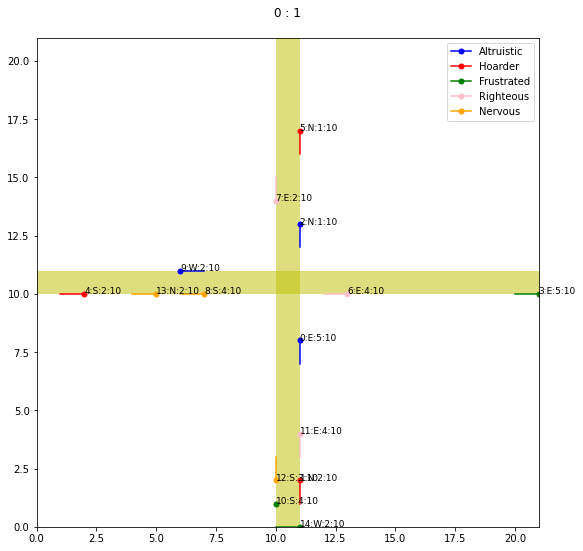

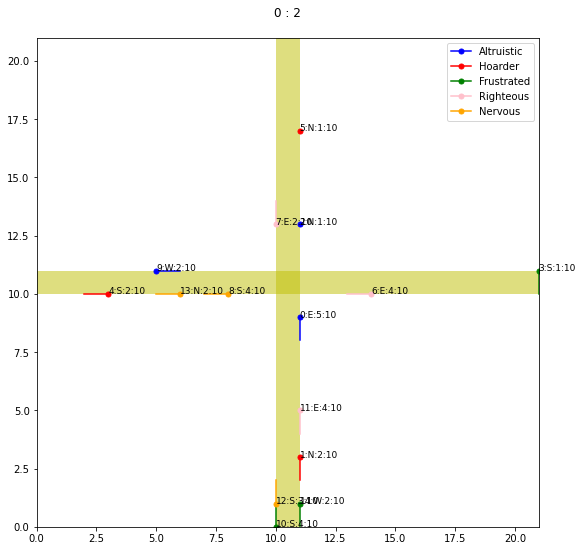

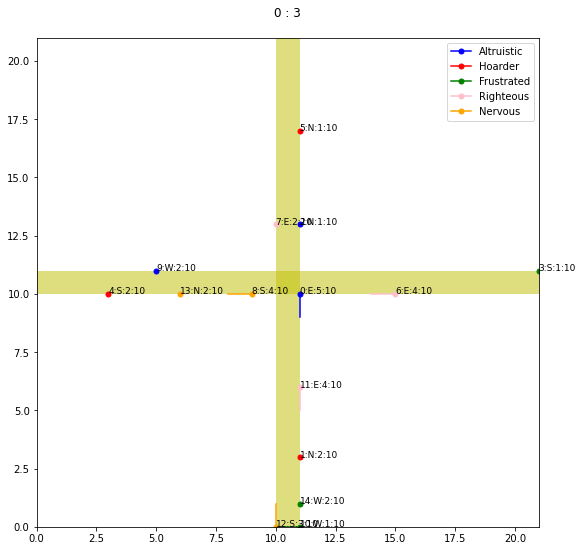

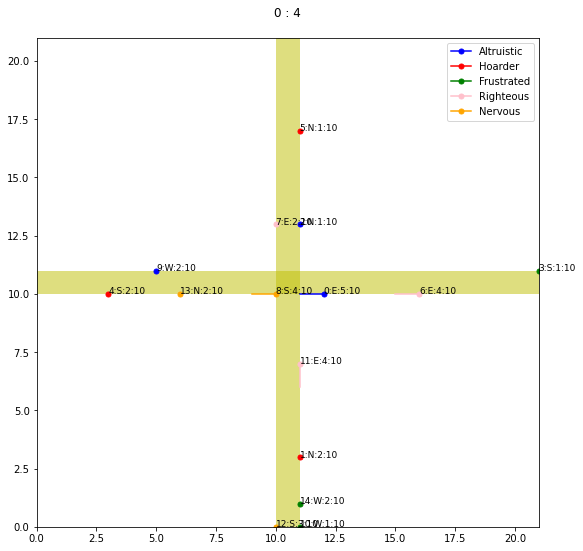

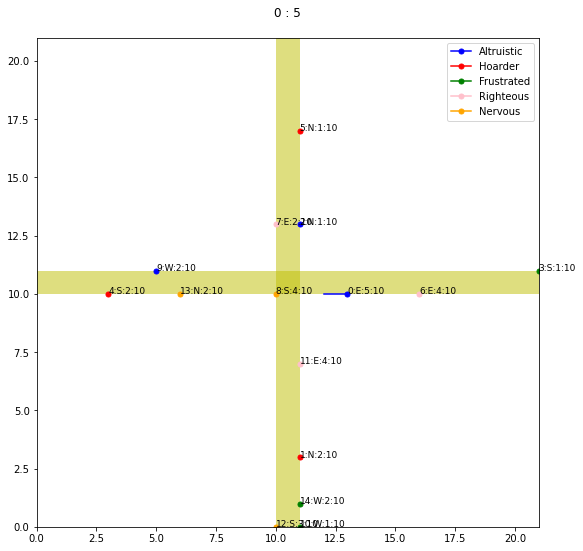

...

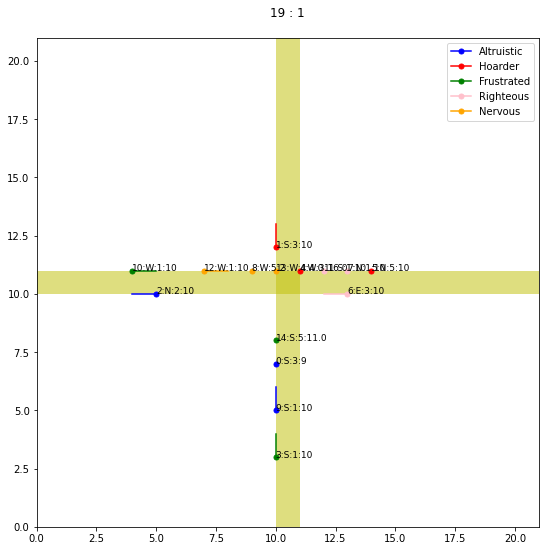

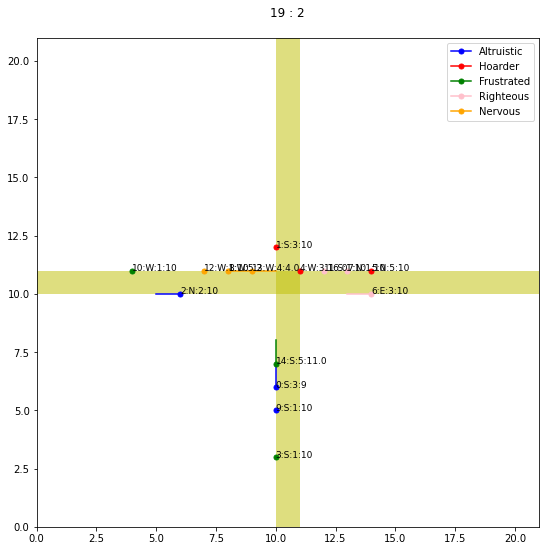

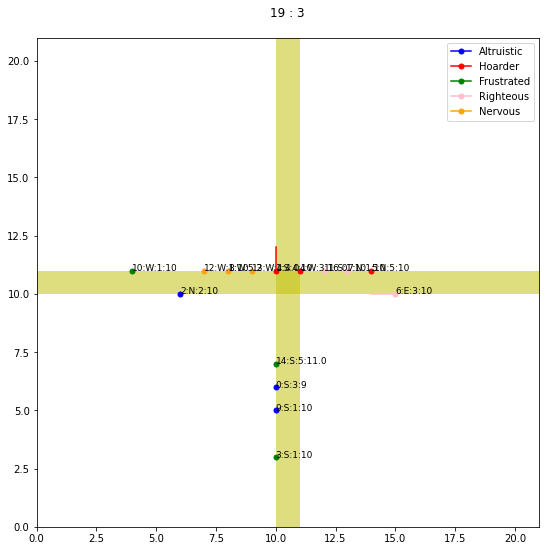

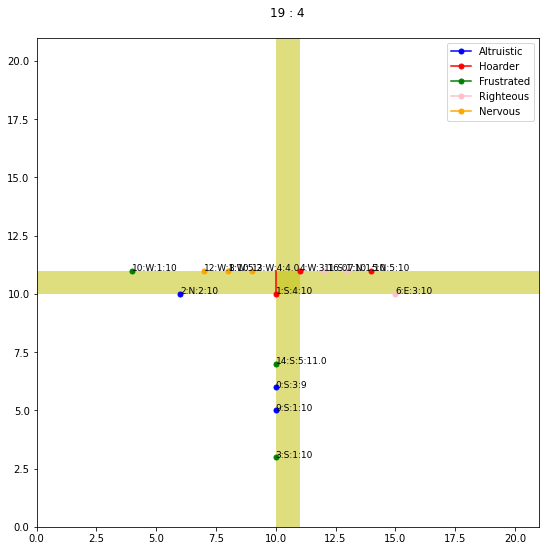

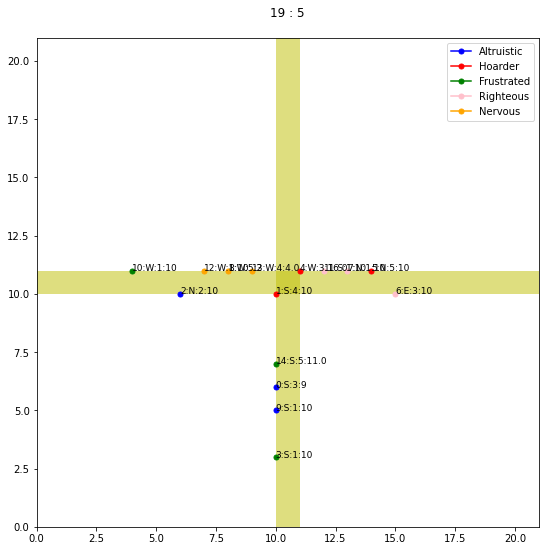

              time_at_junction_all        
                              mean min max
type_of_cross                             
left                      4.555000   0  13
right                     3.764444   0  18
straight                  3.270000   0   8
                         time_at_junction_all        
                                         mean min max
profile    type_of_cross                             
Altruistic left                      1.215000   0   5
           right                     4.870000   0  16
Frustrated right                     5.423333   0  15
Hoarder    right                     2.105000   0  18
           straight                  3.880000   0   7
Nervous    left                      7.780000   0  13
           right                     3.805000   0  17
Righteous  left                      8.010000   0   9
           right                     0.920000   0   1
           straight                  2.660000   0   8
              time_at_junction_all      

In [4]:
# parametry modelu
num_steps = 20
num_agents = 3 * 5
size_of_jun = 10

#równy podział profili
buff = int(num_agents / 5)
amount_of_types = {'Righteous':buff, 'Hoarder':buff, 'Nervous':buff, 'Frustrated':buff, 'Altruistic':buff}



model = Juntion_model(amount_of_types, num_agents, size_of_jun, True)  #5*2*4 +4 =44

for i in range(num_steps):
    model.step()
    
# input  
all_cases, profile, haste = caluculate_input(model)

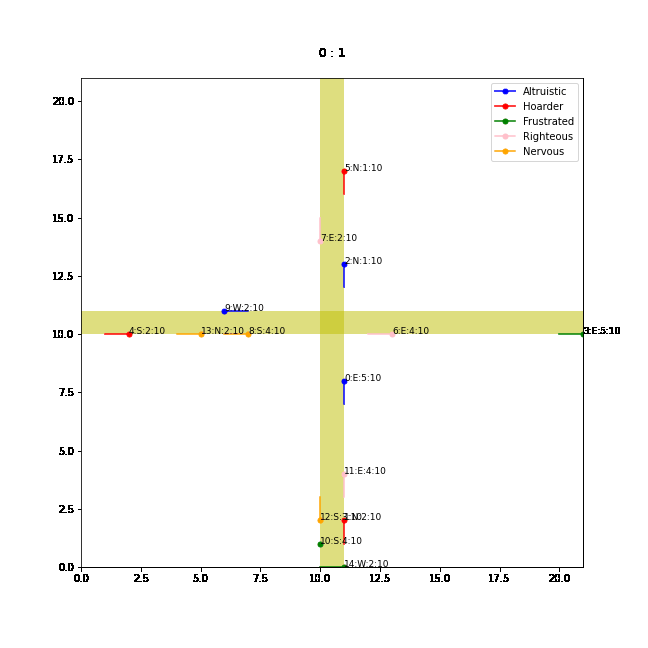

In [5]:
# wizualizacja w postaci gifa

filenames = os.listdir('anim\\')
images = []

for filename in filenames:
    filename = 'anim\\' + filename
    images.append(imageio.imread(filename))
imageio.mimsave('gif\\test.gif', images, duration=1)

from IPython.display import Image

with open('gif\\test.gif','rb') as f:
    display(Image(data=f.read(), format='png'))

In [8]:
# wyniki

print(all_cases)
print(profile)
print(all_cases)

              time_at_junction_all        
                              mean min max
type_of_cross                             
left                      4.130000   0  10
right                     2.277500   0   8
straight                  4.843333   0  13
                         time_at_junction_all        
                                         mean min max
profile    type_of_cross                             
Altruistic right                        1.610   0   8
           straight                     5.035   0  13
Frustrated left                         6.710   0   9
           right                        2.220   0   5
Hoarder    left                         2.860   0   4
           straight                     4.510   0   9
Nervous    left                         5.260   0   7
           straight                     4.985   0  10
Righteous  left                         2.910   0  10
           right                        3.060   0   4
              time_at_junction_all      